# .NET Initialization
<div style="width:100%;height:6px;background-color:Black;"></div>

MiniSim is a .net dll and as such we need to import the pythonnet module (clr) and load the .net DLL into the Python kernel. Afterwards we can import the .net namespaces as Python modules.

In [1]:
import clr
clr.AddReference(r"..\bin\MiniSim.Core")
clr.AddReference(r"..\bin\MiniSim.FlowsheetDrawing")

import MiniSim.Core.Expressions as expr
from  MiniSim.Core.Flowsheeting import MaterialStream, Flowsheet,IconTypes
from  MiniSim.Core.Flowsheeting.Documentation import SpreadsheetElement
import MiniSim.Core.Numerics as num
from MiniSim.Core.UnitsOfMeasure import Unit, SI, METRIC, PhysicalDimension
from MiniSim.Core.ModelLibrary import Flash, Heater, Mixer, Splitter, EquilibriumStageSection
import MiniSim.Core.PropertyDatabase as chemsep
from MiniSim.Core.Reporting import Generator, StringBuilderLogger
from MiniSim.Core.Thermodynamics import ThermodynamicSystem
from MiniSim.FlowsheetDrawing import FlowsheetDrawer, DrawingOptions

In [2]:
%matplotlib inline

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import Image as render

plt.rcParams["figure.figsize"] = (16,8)
plt.rcParams['grid.color'] = 'k'

# General Objects Instantiation
<div style="width:100%;height:6px;background-color:Black;"></div>

In [4]:
Database = chemsep.ChemSepAdapter()
logger = StringBuilderLogger();
reporter = Generator(logger)

In [5]:
def calc(flowsheet, relax, maxIter):
    presolver=  num.BasicNewtonSolver(logger)
    presolver.MaximumIterations=maxIter
    presolver.BrakeFactor=relax
    presolver.Solve(flowsheet)
    print (logger.Flush())
    
def decomp(flowsheet):
    solver= num.DecompositionSolver(logger)
    solver.Solve(flowsheet)
    print (logger.Flush())
    
def convertFlowsheet(flowsheet, options=None):
    drawer= FlowsheetDrawer()
    if(options!=None):
        drawer.Options=options
    return bytes(drawer.DrawAsBase64(flowsheet)) 

# Definition of the Thermo-System
<div style="width:100%;height:6px;background-color:Black;"></div>

When an instance of the ThermodynamicSystem class is created, we can define the base method (NRTL. UNIQUAC or SRK). This will set the internal states accordingly. Alternatively the equilibrium approach could be chosen explicitly with the respective data classes. 

We then add three compontents from the ChemSep Database, Benzene, Toluene and P-Xylene. Use the ListComponents(string) method to find suitable components, and then use the exact spelling to select it from the databank.

In [6]:
sys= ThermodynamicSystem("Test2","NRTL", "default")
sys.AddComponent(Database.FindComponent("Benzene"))
sys.AddComponent(Database.FindComponent("Toluene"))
sys.AddComponent(Database.FindComponent("P-xylene"))
Database.FillBIPs(sys)

# Flowsheet Definition
<div style="width:100%;height:6px;background-color:Black;"></div>

First we create the feed stream S01. For this stream, we specify the temperature and pressure, as well as the total molar flow and the molar composition. 

If ALL molar fractions are specified, the summation closure equation is not added to the equation system. In that case, the composition must add up to exactly one. In this example, we initialize the molar fraction of P-xylene, which means that it is still a free variable, and as such the closure will be added to the equation system.

We need to define our own unit of measure for the molar flow, but because Pythonnet does not support .net operator overlading, we have to use a helper function that creates an aggregate unit: kmol/h

In [7]:
kmolh=Unit.Make([SI.kmol],[SI.h])
tonh=Unit.Make([METRIC.ton],[SI.h])

sys.VariableFactory.SetOutputDimension(PhysicalDimension.Pressure, METRIC.mbar)
sys.VariableFactory.SetOutputDimension(PhysicalDimension.MassFlow, tonh)

In [8]:
S01 = (MaterialStream("S01", sys)
    .Specify("T",358, SI.K)
    .Specify("P",0.37, METRIC.bar)
    .Specify("n",100.0, kmolh)
    .Specify("x[Benzene]",0.3)
    .Specify("x[Toluene]",0.3)
    .Init("x[P-xylene]",0.4)
    .InitializeFromMolarFractions()
    .FlashPT())

S02 = MaterialStream("S02", sys)
S03 = MaterialStream("S03", sys)
S04 = MaterialStream("S04", sys)
S05 = MaterialStream("S05", sys)
S06 = MaterialStream("S06", sys)
S07 = (MaterialStream("S07", sys)
        .Init("VF", 0)
        .Init("P", 0.37, METRIC.bar)
        .Init("n[Benzene]",120, kmolh)
        .Init("n[Toluene]", 1, kmolh)
        .Init("n[P-xylene]", 0, kmolh)
        .InitializeFromMolarFlows()
        .FlashPZ())
S08 = (MaterialStream("S08", sys)
        .Init("VF", 1)
        .Init("P", 0.37, METRIC.bar)
        .Init("n[Benzene]",10, kmolh)
        .Init("n[Toluene]", 50, kmolh)
        .Init("n[P-xylene]", 0, kmolh)
        .InitializeFromMolarFlows()
        .FlashPZ())
S09 = (MaterialStream("S09", sys)
        .Init("VF", 0)
        .Init("P", 1, METRIC.bar)
        .Init("n[Benzene]",0.5, kmolh)
        .Init("n[Toluene]", 57, kmolh)
        .Init("n[P-xylene]", 10, kmolh)
        .InitializeFromMolarFlows()
        .FlashPZ())
S10 = (MaterialStream("S10", sys)
         .Init("VF", 0)
        .Init("P", 1, METRIC.bar)
        .Init("n[Benzene]",0.5, kmolh)
        .Init("n[Toluene]", 57, kmolh)
        .Init("n[P-xylene]", 10, kmolh)
        .InitializeFromMolarFlows()
        .FlashPZ())
S11 = MaterialStream("S11", sys)
S12 = (MaterialStream("S12", sys)
       .Init("VF", 1)
        .Init("P", 0.37, METRIC.bar)
        .Init("n[Benzene]",10, kmolh)
        .Init("n[Toluene]", 50, kmolh)
        .Init("n[P-xylene]", 0, kmolh)
        .InitializeFromMolarFlows()
        .FlashPZ())
S13 = MaterialStream("S13", sys)
S14 = (MaterialStream("S14", sys)
        .Init("VF", 0)
        .Init("P", 0.37, METRIC.bar)
        .Init("n[Benzene]",9, kmolh)
        .Init("n[Toluene]", 46, kmolh)
        .Init("n[P-xylene]", 0, kmolh)
        .InitializeFromMolarFlows()
        .FlashPZ())
S15 = (MaterialStream("S15", sys)
       .Init("VF", 1)
        .Init("P", 0.37, METRIC.bar)
        .Init("n[Benzene]",10, kmolh)
        .Init("n[Toluene]", 50, kmolh)
        .Init("n[P-xylene]", 0, kmolh)
        .InitializeFromMolarFlows()
        .FlashPZ())
        
S16 = (MaterialStream("S16", sys)
        .Init("VF", 0)
        .Init("P", 0.37, METRIC.bar)
        .Init("n[Benzene]",9, kmolh)
        .Init("n[Toluene]", 46, kmolh)
        .Init("n[P-xylene]", 0, kmolh)
        .InitializeFromMolarFlows()
        .FlashPZ())
S17 = MaterialStream("S17", sys)
S18 = MaterialStream("S18", sys)
S19 = (MaterialStream("S19", sys)
         .Init("VF", 1)
        .Init("P", 0.37, METRIC.bar)
        .Init("n[Benzene]",0, kmolh)
        .Init("n[Toluene]", 30, kmolh)
        .Init("n[P-xylene]", 100, kmolh)
        .InitializeFromMolarFlows()
        .FlashPZ())
S20 = (MaterialStream("S20", sys)
        .Init("VF", 1)
        .Init("P", 0.37, METRIC.bar)
        .Init("n[Benzene]",10, kmolh)
        .Init("n[Toluene]", 50, kmolh)
        .Init("n[P-xylene]", 0, kmolh)
        .InitializeFromMolarFlows()
        .FlashPZ())
S21 = MaterialStream("S21", sys)

Once all the streams are defined, the final flowsheet can be assembled.

In [9]:
SEGL = (EquilibriumStageSection("SEGL",sys,20)
        .Connect("VIn", S16)
        .Connect("LIn", S09)
        .Connect("VOut", S02)
        .Connect("LOut", S11)
        .ConnectFeed(S01,11)        
        .MakeAdiabatic()
        .MakeIsobaric()
        .FixStageEfficiency(1.0)
        )

SEGT = (EquilibriumStageSection("SEGT",sys,20)
        .Connect("VIn", S03)
        .Connect("LIn", S07)
        .Connect("VOut", S04)
        .Connect("LOut", S08)              
        .MakeAdiabatic()
        .MakeIsobaric()
        .FixStageEfficiency(1.0)
        )

SEGR = (EquilibriumStageSection("SEGR",sys,20)
        .Connect("VIn", S15)
        .Connect("LIn", S10)
        .Connect("VOut", S20)
        .Connect("LOut", S12)
        .ConnectLiquidSidestream(S13, 10,0.8)
        .MakeAdiabatic()
        .MakeIsobaric()        
        .FixStageEfficiency(1.0)
        )



SEGB = (EquilibriumStageSection("SEGB",sys,20)
        .Connect("VIn", S19)
        .Connect("LIn", S14)
        .Connect("VOut", S21)
        .Connect("LOut", S17)              
        .MakeAdiabatic()
        .MakeIsobaric()
        .FixStageEfficiency(1.0)
        )
      
GMIX = (Mixer("GMIX",sys)
    .Connect("In", S02)
    .Connect("In", S20)
    .Connect("Out", S03)
    .Specify("DP",0, METRIC.bar)
    )

      
LMIX = (Mixer("LMIX",sys)
    .Connect("In", S11)
    .Connect("In", S12)
    .Connect("Out", S14)
    .Specify("DP",0, METRIC.bar)
    )

GSPLIT = (Splitter("GSPLIT",sys)
    .Connect("In", S21)
    .Connect("Out1", S16)
    .Connect("Out2", S15)
    .Specify("DP",0, METRIC.bar)
    .Specify("K",0.5)
    )

LSPLIT = (Splitter("LSPLIT",sys)
    .Connect("In", S08)
    .Connect("Out1", S10)
    .Connect("Out2", S09)
    .Specify("DP",0, METRIC.bar)
    .Specify("K",0.5)
    )

REB = (Flash("REB",sys)
        .Connect("In", S17)
        .Connect("Vap", S19)
        .Connect("Liq", S18)
        .Specify("P",0.37, METRIC.bar)
        .Specify("VF",0.6)
        )

COND = (Heater("COND",sys)
    .Connect("In", S04)
    .Connect("Out", S05)
    .Specify("P",0.37, METRIC.bar)
    .Specify("VF",0)
    )

RSPLIT = (Splitter("RSPLIT",sys)
    .Connect("In", S05)
    .Connect("Out1", S06)
    .Connect("Out2", S07)
    .Specify("DP",0, METRIC.bar)
    .Specify("K",0.4)
    )


flowsheet= (Flowsheet("Flow")
    .AddMaterialStreams(S01, S02, S03,S04,S05,S06,S07,S08,S09,S10,S11,S12,S13,S14,S15,S16,S17,S18,S19,S20,S21)
    .AddUnits(SEGL,SEGR,SEGT,SEGB,GMIX,LMIX,GSPLIT,LSPLIT,REB,COND,RSPLIT))

Now that all the objects are created we can assemble them in a flowsheet.

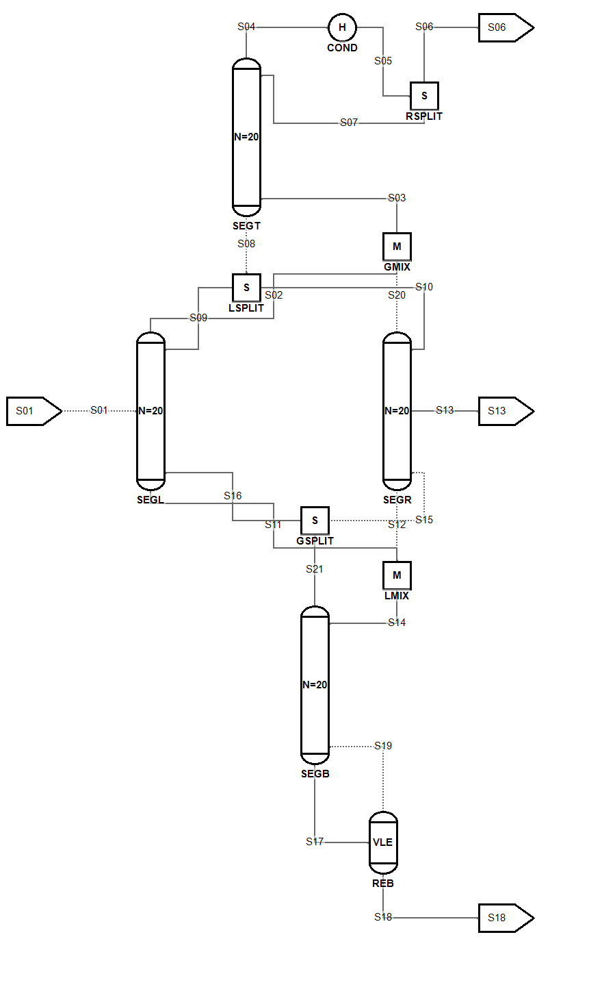

In [10]:
S01.SetIcon(IconTypes.Stream, 10,580)
S02.SetIcon(IconTypes.Stream, 260,330)
S11.SetIcon(IconTypes.Stream, 260,660)

SEGL.SetIcon(IconTypes.ColumnSection, 200,500)
SEGR.SetIcon(IconTypes.ColumnSection, 560,500)
SEGT.SetIcon(IconTypes.ColumnSection, 340,100)
SEGB.SetIcon(IconTypes.ColumnSection, 440,900)

GMIX.SetIcon(IconTypes.Mixer, 560,340)
LMIX.SetIcon(IconTypes.Mixer, 560,820)

GSPLIT.SetIcon(IconTypes.Splitter, 440,740)
LSPLIT.SetIcon(IconTypes.Splitter, 340,400)

COND.SetIcon(IconTypes.Heater, 480,20)
RSPLIT.SetIcon(IconTypes.Splitter, 600,120)

REB.SetIcon(IconTypes.TwoPhaseFlash, 540,1200)

S03.SetIcon(IconTypes.Stream, 400,260)
S20.SetIcon(IconTypes.Stream, 400,480)

S04.SetIcon(IconTypes.Stream, 500,20)

S06.SetIcon(IconTypes.Stream, 700,20)
S18.SetIcon(IconTypes.Stream, 700,1320)
S13.SetIcon(IconTypes.Stream, 700,580)

LSPLIT.RotatePorts(1)
GSPLIT.RotatePorts(-1)

LMIX.RotatePorts(1)
GMIX.RotatePorts(-1)

options=DrawingOptions()
options.ShowStreamWidth=False
options.ShowPressure=False
options.ShowTemperature=False
options.ShowMassFlow=False
render(convertFlowsheet(flowsheet,options))

# Initializing the flowsheet
<div style="width:100%;height:6px;background-color:Black;"></div>

To initalize the flowsheet a single pass around each unit is conducted using the Initialize() method. 

In [11]:
SEGL.Initialize()
GMIX.Initialize()
SEGT.Initialize()
COND.Initialize()
RSPLIT.Initialize()
SEGT.Initialize()
LSPLIT.Initialize()
SEGR.Initialize()
LMIX.Initialize()
SEGB.Initialize()
REB.Initialize()
GSPLIT.Initialize()    
print(logger.Flush())

# Solve the entire flowsheet

In [12]:
presolver=  num.DecompositionSolver(logger)
presolver.Solve(flowsheet)
presolver.Solve(flowsheet)
print(logger.Flush())

Decomposition Result: V=1876, E=1876, Blocks=511, Singletons=494
Block Statistics:
   # Var # Blocks % Blocks
       1      494  96,67 %
       7        4   0,78 %
       8       12   2,35 %
    1258        1   0,20 %
Solving problem Subproblem 122 (Size: 1258) failed!
The 10 most problematic constraints are:
TraySection          SEGT                                 -1,6219242 ( EQ001412 >> 0 := (V[18] * HV[18] + L[16] * HL[16] + F[17] * HF[17] + Q[17]) / 1000 - ((1 + RV[17]) * V[17] * HV[17] + (1 + RL[17]) * L[17] * HL[17]) / 1000 = -1,62192420934906 )
TraySection          SEGT                                 -1,5886512 ( EQ001426 >> 0 := (V[19] * HV[19] + L[17] * HL[17] + F[18] * HF[18] + Q[18]) / 1000 - ((1 + RV[18]) * V[18] * HV[18] + (1 + RL[18]) * L[18] * HL[18]) / 1000 = -1,58865118591399 )
TraySection          SEGT                                 -1,3803996 ( EQ001398 >> 0 := (V[17] * HV[17] + L[15] * HL[15] + F[16] * HF[16] + Q[16]) / 1000 - ((1 + RV[16]) * V[16] * HV[16] + (1

# Activate Design Specifications: Purity at top and bottom

In [13]:
REB.Unspecify("VF")
S18.GetVariable("x[P-xylene]").Fix(0.99)
RSPLIT.Unspecify("K")
S06.GetVariable("x[Benzene]").Fix(0.99)

decomp(flowsheet)
print(logger.Flush())

Decomposition Result: V=1876, E=1876, Blocks=504, Singletons=487
Block Statistics:
   # Var # Blocks % Blocks
       1      487  96,63 %
       7        4   0,79 %
       8       12   2,38 %
    1265        1   0,20 %
Problem Flow was successfully solved (1,187 seconds)




# Show the flowsheet diagram

In [14]:
sheet1=(SpreadsheetElement("Results")
    .SetIcon(IconTypes.Spreadsheet, 20,40)
    .SetSize(400,400)
    .AddVariable(REB.GetVariable("Q"))
    .AddVariable(REB.GetVariable("VF"))
    .AddVariable(COND.GetVariable("Q"))   
    .AddVariable(RSPLIT.GetVariable("K"))
    .AddVariable(LSPLIT.GetVariable("K"))
    .AddVariable(GSPLIT.GetVariable("K"))   
    .AddVariable(S06.GetVariable("x[Benzene]"))
    .AddVariable(S13.GetVariable("x[Toluene]"))
    .AddVariable(S18.GetVariable("x[P-xylene]"))    
       )

flowsheet.AddDocumentation(sheet1)

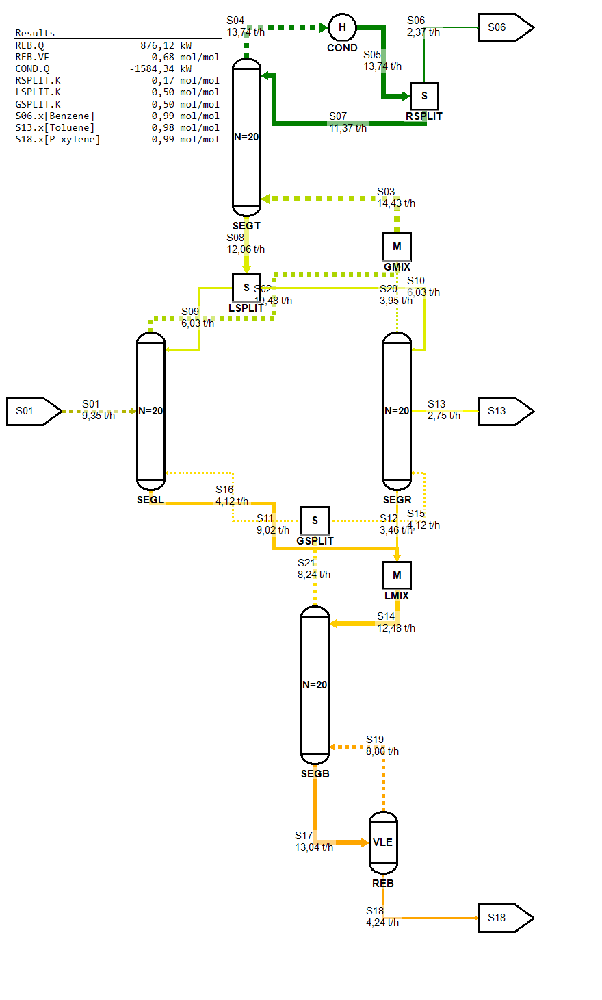

In [15]:
options=DrawingOptions()
options.ShowStreamWidth=True
options.ShowPressure=False
options.ShowTemperature=False
options.ShowStreamColors=True
options.ColorMap["Benzene"]="Green"
options.ColorMap["Toluene"]="Yellow"
options.ColorMap["P-xylene"]="Orange"
render(convertFlowsheet(flowsheet,options))

In [16]:
reporter.Report(flowsheet,6,False)
print(logger.Flush())


Report for flowsheet Flow

Material Streams

System                    Test2      

Property                  Unit                S01          S02          S03          S04          S05          S06

Temperature               °C              84.8500      73.3685      73.9787      51.2623      50.9303      50.9303
Pressure                  mbar           370.0000     370.0000     370.0000     370.0000     370.0000     370.0000
Vapor Fraction            mol/mol          0.7293       1.0000       1.0000       1.0000       0.0000       0.0000
Specific Enthalpy         kJ/kmol      -2983.0172    5104.7886    5211.5913    2264.8306  -30217.0656  -30217.0656
Phase                                 LiquidVapor        Vapor  LiquidVapor        Vapor  BubblePoint  LiquidVapor
Density                   kmol/cum         0.0170       0.0128       0.0128       0.0137      10.8166      10.8166
Mass Density              kg/cum           1.5935       1.1275       1.1314       1.0734     846.4206     846